In [1]:
!pip list

Package                   Version
------------------------- --------------
accelerate                0.31.0
aiohttp                   3.9.5
aiosignal                 1.3.1
anyio                     4.4.0
argon2-cffi               23.1.0
argon2-cffi-bindings      21.2.0
arrow                     1.3.0
asttokens                 2.4.1
async-lru                 2.0.4
async-timeout             4.0.3
attrs                     23.2.0
Babel                     2.15.0
backcall                  0.2.0
beautifulsoup4            4.12.3
bleach                    6.1.0
certifi                   2024.6.2
cffi                      1.16.0
charset-normalizer        3.3.2
click                     8.1.7
colorama                  0.4.6
comm                      0.2.2
datasets                  2.19.2
debugpy                   1.8.1
decorator                 5.1.1
defusedxml                0.7.1
dill                      0.3.8
exceptiongroup            1.2.1
executing                 2.0.1
fastjsonschema    

In [1]:
import numpy as np
import pandas as pd
import re

import os, shutil, json
from glob import glob
from tqdm import tqdm

from IPython.display import display

In [2]:
work_dir = os.getcwd()
work_dir

'C:\\Users\\User\\Desktop\\Pice\\Work\\ConnectedTech\\UTAC_OCR\\Text_Recognition\\TrOCR'

In [3]:
def get_text_label(json_file_path):
    with open(json_file_path, 'r') as file:
        data = json.load(file)
    return data['text']


# Function to extract the number after "image_"
def extract_number(filename):
    match = re.search(r'image_(\d+)', filename)
    if match:
        return int(match.group(1))
    return float('inf')  # Return a very high number if no match is found
    

work_dir = os.getcwd()
dataset_dir = os.path.join(work_dir, "augmented_dataset")

train_dir = os.path.join(dataset_dir, "train")
train_img_dir = os.path.join(train_dir, "images")
train_annot_dir = os.path.join(train_dir, "annotations")

val_dir = os.path.join(dataset_dir, "val")
val_img_dir = os.path.join(val_dir, "images")
val_annot_dir = os.path.join(val_dir, "annotations")


train_img_paths = sorted(glob(f"{train_img_dir}/*"), key=extract_number)
train_img_files = [os.path.basename(i) for i in train_img_paths]
train_labels = [get_text_label(i) for i in sorted(glob(f"{train_annot_dir}/*.json"), key=extract_number)]

val_img_paths = sorted(glob(f"{val_img_dir}/*"), key=extract_number)
val_img_files = [os.path.basename(i) for i in val_img_paths]
val_labels = [get_text_label(i) for i in sorted(glob(f"{val_annot_dir}/*.json"), key=extract_number)]

print(len(train_img_files),len(train_labels),len(val_img_files),len(val_labels),)
print(train_img_files[:5], train_labels[:5])
print(val_img_files[:5], val_labels[:5])


train_df = pd.DataFrame({'file_name': train_img_files, "text": train_labels})
val_df = pd.DataFrame({'file_name': val_img_files, "text": val_labels})

display(train_df)
display(val_df)

1200 1200 73 73
['image_0.jpg', 'image_1.jpg', 'image_2.jpg', 'image_3.jpg', 'image_4.jpg'] ['3A043', '6A078', '3P028', '8K032', '4P014']
['image_1.jpg', 'image_2.jpg', 'image_3.jpg', 'image_4.jpg', 'image_5.jpg'] ['8Z003', '8Z004', '8Z006', '8Z008', '8Z036']


,file_name,text
0,image_0.jpg,3A043
1,image_1.jpg,6A078
2,image_2.jpg,3P028
3,image_3.jpg,8K032
4,image_4.jpg,4P014
...,...,...
1195,image_1195.jpg,4P032
1196,image_1196.jpg,4Z048
1197,image_1197.jpg,9P033
1198,image_1198.jpg,6A052


,file_name,text
0,image_1.jpg,8Z003
1,image_2.jpg,8Z004
2,image_3.jpg,8Z006
3,image_4.jpg,8Z008
4,image_5.jpg,8Z036
...,...,...
68,image_1245.jpg,4H063
69,image_1246.jpg,4H097
70,image_1247.jpg,4A079
71,image_1248.jpg,3Z085


In [4]:
import torch
from torch.utils.data import Dataset
from PIL import Image

class UTACAugmentedDataset(Dataset):
    def __init__(self, root_dir, df, processor, max_target_length=16):
        self.root_dir = root_dir
        self.df = df
        self.processor = processor
        self.max_target_length = max_target_length

    def __len__(self):
        return len(self.df)

    def __getitem__(self, idx):
        # get file name + text 
        file_name = self.df['file_name'][idx]
        text = self.df['text'][idx]
        # prepare image (i.e. resize + normalize)
        image = Image.open(os.path.join(self.root_dir, file_name)).convert("RGB")
        pixel_values = self.processor(image, return_tensors="pt").pixel_values
        # add labels (input_ids) by encoding the text
        labels = self.processor.tokenizer(text, 
                                          padding="max_length", 
                                          max_length=self.max_target_length).input_ids
        # important: make sure that PAD tokens are ignored by the loss function
        labels = [label if label != self.processor.tokenizer.pad_token_id else -100 for label in labels]

        encoding = {"pixel_values": pixel_values.squeeze(), "labels": torch.tensor(labels)}
        return encoding

In [5]:
from transformers import TrOCRProcessor

processor = TrOCRProcessor.from_pretrained("microsoft/trocr-large-printed")
train_dataset = UTACAugmentedDataset(root_dir=train_img_dir,
                           df=train_df,
                           processor=processor)
eval_dataset = UTACAugmentedDataset(root_dir=val_img_dir,
                           df=val_df,
                           processor=processor)

C:\Users\User\Desktop\Pice\Work\ConnectedTech\UTAC_OCR\Text_Recognition\TrOCR\trocr_env\lib\site-packages\tqdm\auto.py:21: TqdmWarning: IProgress not found. Please update jupyter and ipywidgets. See https://ipywidgets.readthedocs.io/en/stable/user_install.html
  from .autonotebook import tqdm as notebook_tqdm


In [6]:
print("Number of training examples:", len(train_dataset))
print("Number of validation examples:", len(eval_dataset))

Number of training examples: 1200
Number of validation examples: 73


In [7]:
from transformers import VisionEncoderDecoderModel

model = VisionEncoderDecoderModel.from_pretrained("microsoft/trocr-large-printed")

Some weights of VisionEncoderDecoderModel were not initialized from the model checkpoint at microsoft/trocr-large-printed and are newly initialized: ['encoder.pooler.dense.bias', 'encoder.pooler.dense.weight']
You should probably TRAIN this model on a down-stream task to be able to use it for predictions and inference.


In [8]:
# Total parameters and trainable parameters.
total_params = sum(p.numel() for p in model.parameters())
print(f"{total_params:,} total parameters.")
total_trainable_params = sum(
    p.numel() for p in model.parameters() if p.requires_grad)
print(f"{total_trainable_params:,} training parameters.")

609,169,408 total parameters.
609,169,408 training parameters.


In [9]:
# set special tokens used for creating the decoder_input_ids from the labels
model.config.decoder_start_token_id = processor.tokenizer.cls_token_id
model.config.pad_token_id = processor.tokenizer.pad_token_id
# make sure vocab size is set correctly
model.config.vocab_size = model.config.decoder.vocab_size

# set beam search parameters
model.config.eos_token_id = processor.tokenizer.sep_token_id
model.config.max_length = 16  # Adjusted max_length to better fit your use case   # 64
model.config.early_stopping = True
model.config.no_repeat_ngram_size = 3
model.config.length_penalty = 2.0
model.config.num_beams = 4

In [10]:
from transformers import Seq2SeqTrainer, Seq2SeqTrainingArguments
from datasets import load_metric


class TrainingConfig:
    BATCH_SIZE:    int = 4
    EPOCHS:        int = 3
    LEARNING_RATE: float = 0.0001



def compute_metrics(pred):
    labels_ids = pred.label_ids
    pred_ids = pred.predictions

    pred_str = processor.batch_decode(pred_ids, skip_special_tokens=True)
    labels_ids[labels_ids == -100] = processor.tokenizer.pad_token_id
    label_str = processor.batch_decode(labels_ids, skip_special_tokens=True)

    cer = cer_metric.compute(predictions=pred_str, references=label_str)

    return {"cer": cer}


# training args
training_args = Seq2SeqTrainingArguments(
    predict_with_generate=True,
    evaluation_strategy='steps',
    num_train_epochs=TrainingConfig.EPOCHS,
    per_device_train_batch_size=TrainingConfig.BATCH_SIZE,
    per_device_eval_batch_size=TrainingConfig.BATCH_SIZE,
    fp16=True, 
    output_dir="./results",
    save_total_limit=3, # to limit save model amout
    save_strategy="steps",  # Save strategy can be "steps" or "epoch"
    load_best_model_at_end=True,
    logging_steps=2,
    save_steps=300,
    eval_steps=10,
)

# evaluation metric
cer_metric = load_metric("cer")

C:\Users\User\Desktop\Pice\Work\ConnectedTech\UTAC_OCR\Text_Recognition\TrOCR\trocr_env\lib\site-packages\transformers\training_args.py:1474: FutureWarning: `evaluation_strategy` is deprecated and will be removed in version 4.46 of 🤗 Transformers. Use `eval_strategy` instead
  warnings.warn(
C:\Users\User\AppData\Local\Temp\ipykernel_39508\2775355681.py:43: FutureWarning: load_metric is deprecated and will be removed in the next major version of datasets. Use 'evaluate.load' instead, from the new library 🤗 Evaluate: https://huggingface.co/docs/evaluate
  cer_metric = load_metric("cer")
C:\Users\User\Desktop\Pice\Work\ConnectedTech\UTAC_OCR\Text_Recognition\TrOCR\trocr_env\lib\site-packages\datasets\load.py:759: FutureWarning: The repository for cer contains custom code which must be executed to correctly load the metric. You can inspect the repository content at https://raw.githubusercontent.com/huggingface/datasets/2.19.2/metrics/cer/cer.py
You can avoid this message in future by pass

In [11]:
from transformers import default_data_collator

# instantiate trainer
trainer = Seq2SeqTrainer(
    model=model,
    tokenizer=processor.feature_extractor,
    args=training_args,
    compute_metrics=compute_metrics,
    train_dataset=train_dataset,
    eval_dataset=eval_dataset,
    data_collator=default_data_collator,
)

res = trainer.train()

C:\Users\User\Desktop\Pice\Work\ConnectedTech\UTAC_OCR\Text_Recognition\TrOCR\trocr_env\lib\site-packages\transformers\models\trocr\processing_trocr.py:136: FutureWarning: `feature_extractor` is deprecated and will be removed in v5. Use `image_processor` instead.
  warnings.warn(


Step,Training Loss,Validation Loss,Cer
10,1.857300,1.159291,0.238356
20,0.465400,0.788463,0.142466
30,0.753800,0.997077,0.528767
40,0.463200,0.858176,0.208219
50,1.137700,0.552129,0.071233
60,0.602400,0.915125,0.098630
70,0.401700,0.717821,0.101370
80,0.629000,0.664982,0.073973
90,0.851300,0.628132,0.084932
100,0.303900,0.545438,0.057534


C:\Users\User\Desktop\Pice\Work\ConnectedTech\UTAC_OCR\Text_Recognition\TrOCR\trocr_env\lib\site-packages\transformers\generation\utils.py:1283: UserWarning: You have modified the pretrained model configuration to control generation. This is a deprecated strategy to control generation and will be removed soon, in a future version. Please use and modify the model generation configuration (see https://huggingface.co/docs/transformers/generation_strategies#default-text-generation-configuration )
  warnings.warn(
Some non-default generation parameters are set in the model config. These should go into a GenerationConfig file (https://huggingface.co/docs/transformers/generation_strategies#save-a-custom-decoding-strategy-with-your-model) instead. This warning will be raised to an exception in v4.41.
Non-default generation parameters: {'max_length': 16, 'early_stopping': True, 'num_beams': 4, 'length_penalty': 2.0, 'no_repeat_ngram_size': 3}
Some non-default generation parameters are set in th

# Inference

In [56]:
device = torch.device("cuda" if torch.cuda.is_available() else "cpu")

trained_model = VisionEncoderDecoderModel.from_pretrained('./results/checkpoint-900').to(device)

In [57]:
import matplotlib.pyplot as plt

def trocr_inference(image, processor, model):
    # We can directly perform OCR on cropped images.
    pixel_values = processor(image, return_tensors='pt').pixel_values.to(device)
    generated_ids = model.generate(pixel_values)
    generated_text = processor.batch_decode(generated_ids, skip_special_tokens=True)[0]
    return generated_text

def plot_infer(image, text):
    plt.imshow(image)
    plt.title(text)
    plt.show()

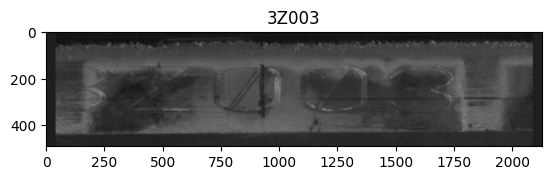

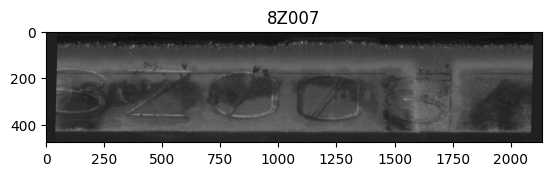

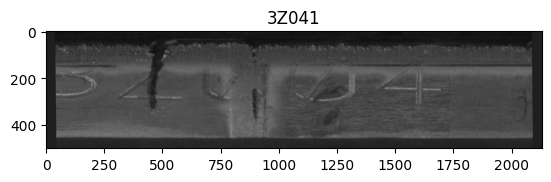

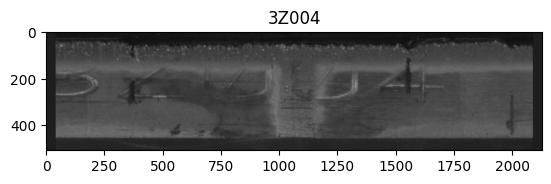

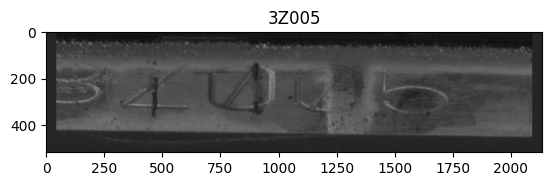

...

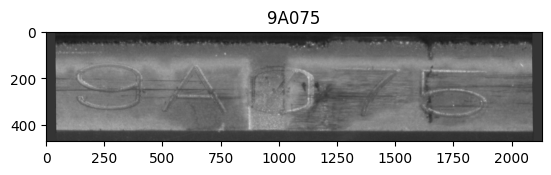

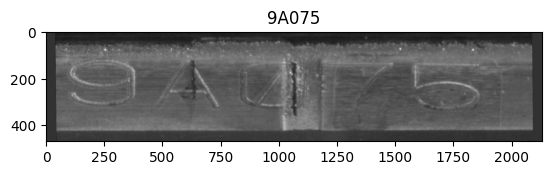

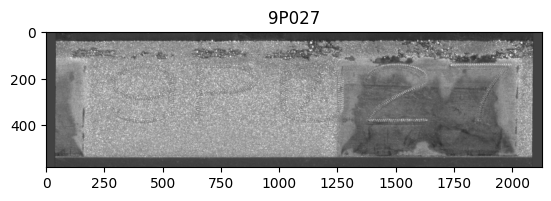

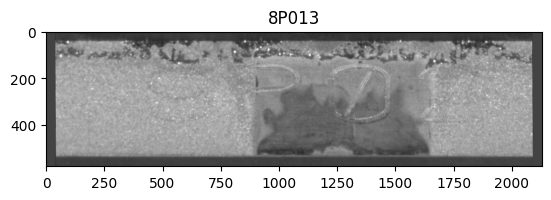

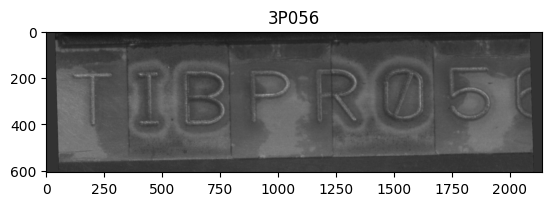

In [58]:
utac_paths = sorted(glob("./test_images/2401UTAC_jpg_cropped/*"))

for i in utac_paths:
    image = Image.open(i).convert("RGB")
    text = trocr_inference(image, processor, trained_model)
    plot_infer(image, text)

# Plots

In [13]:
train_loss_list = []
val_loss_list = []
cer _list = []

for log in trainer.state.log_history:
    if 'loss' in log:
        step = log.get('step', 'N/A')
        loss = log['loss']
        print(f"Step {step}: Loss = {loss}")

Step 2: Loss = 9.219
Step 4: Loss = 7.4839
Step 6: Loss = 4.2053
Step 8: Loss = 2.7236
Step 10: Loss = 1.8573
Step 12: Loss = 0.7941
Step 14: Loss = 1.5184
Step 16: Loss = 0.7059
Step 18: Loss = 0.7604
Step 20: Loss = 0.4654
Step 22: Loss = 0.4319
Step 24: Loss = 1.2621
Step 26: Loss = 0.8967
Step 28: Loss = 0.9611
Step 30: Loss = 0.7538
Step 32: Loss = 1.0237
Step 34: Loss = 0.4905
Step 36: Loss = 0.9101
Step 38: Loss = 0.6587
Step 40: Loss = 0.4632
Step 42: Loss = 0.9003
Step 44: Loss = 1.1187
Step 46: Loss = 0.6826
Step 48: Loss = 1.0307
Step 50: Loss = 1.1377
Step 52: Loss = 0.3517
Step 54: Loss = 0.6348
Step 56: Loss = 0.8456
Step 58: Loss = 0.5733
Step 60: Loss = 0.6024
Step 62: Loss = 1.2778
Step 64: Loss = 0.7367
Step 66: Loss = 0.5232
Step 68: Loss = 0.8571
Step 70: Loss = 0.4017
Step 72: Loss = 0.8036
Step 74: Loss = 0.7108
Step 76: Loss = 0.4687
Step 78: Loss = 0.5944
Step 80: Loss = 0.629
Step 82: Loss = 1.0077
Step 84: Loss = 0.7444
Step 86: Loss = 0.3967
Step 88: Loss = 0

In [15]:
# Extract losses and steps for plotting
steps = []
losses = []

for log in trainer.state.log_history:
    if 'loss' in log:
        steps.append(log.get('step', len(steps) + 1))  # Use step if available, else plot number
        losses.append(log['loss'])
    if 

# Plot the losses
plt.figure(figsize=(10, 6))
plt.plot(steps, losses, marker='o', linestyle='-', color='b')
plt.xlabel('Plot Number')
plt.ylabel('Loss')
plt.title('Training Loss Over Time')
plt.grid(True)
plt.show()

{'loss': 9.219, 'grad_norm': 101.09366607666016, 'learning_rate': 4.994444444444445e-05, 'epoch': 0.006666666666666667, 'step': 2}
{'loss': 7.4839, 'grad_norm': 51.29001235961914, 'learning_rate': 4.9888888888888894e-05, 'epoch': 0.013333333333333334, 'step': 4}
{'loss': 4.2053, 'grad_norm': 45.091552734375, 'learning_rate': 4.977777777777778e-05, 'epoch': 0.02, 'step': 6}
{'loss': 2.7236, 'grad_norm': 64.27277374267578, 'learning_rate': 4.966666666666667e-05, 'epoch': 0.02666666666666667, 'step': 8}
{'loss': 1.8573, 'grad_norm': 19.97344207763672, 'learning_rate': 4.955555555555556e-05, 'epoch': 0.03333333333333333, 'step': 10}
{'eval_loss': 1.15929114818573, 'eval_cer': 0.23835616438356164, 'eval_runtime': 20.1916, 'eval_samples_per_second': 3.615, 'eval_steps_per_second': 0.941, 'epoch': 0.03333333333333333, 'step': 10}
{'loss': 0.7941, 'grad_norm': 24.581693649291992, 'learning_rate': 4.9444444444444446e-05, 'epoch': 0.04, 'step': 12}
{'loss': 1.5184, 'grad_norm': 29.48326873779297

In [18]:
!pip install matplotlib

  Using cached matplotlib-3.7.5-cp38-cp38-win_amd64.whl.metadata (5.8 kB)
  Using cached contourpy-1.1.1-cp38-cp38-win_amd64.whl.metadata (5.9 kB)
  Using cached cycler-0.12.1-py3-none-any.whl.metadata (3.8 kB)
     ---------------------------------------- 0.0/165.5 kB ? eta -:--:--
     --------- --------------------------- 41.0/165.5 kB 960.0 kB/s eta 0:00:01
     -------------------------------------- 165.5/165.5 kB 2.5 MB/s eta 0:00:00
  Using cached kiwisolver-1.4.5-cp38-cp38-win_amd64.whl.metadata (6.5 kB)
  Using cached pyparsing-3.1.2-py3-none-any.whl.metadata (5.1 kB)
Using cached matplotlib-3.7.5-cp38-cp38-win_amd64.whl (7.5 MB)
Using cached contourpy-1.1.1-cp38-cp38-win_amd64.whl (477 kB)
Using cached cycler-0.12.1-py3-none-any.whl (8.3 kB)
   ---------------------------------------- 0.0/1.5 MB ? eta -:--:--
   ----------- ---------------------------- 0.4/1.5 MB 9.2 MB/s eta 0:00:01
   ------------------------------- -------- 1.2/1.5 MB 12.5 MB/s eta 0:00:01
   -------------

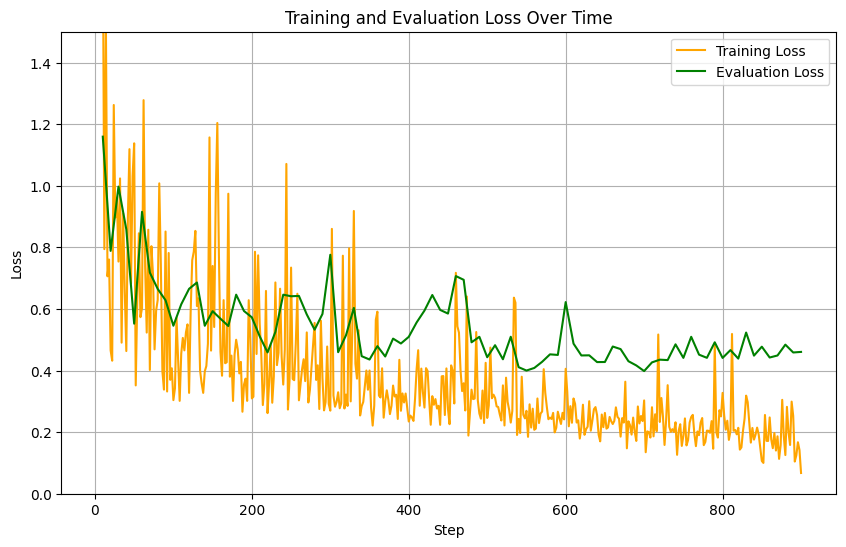

In [25]:
import matplotlib.pyplot as plt

# Extract losses and steps for plotting
train_steps = []
train_losses = []
eval_steps = []
eval_losses = []

for log in trainer.state.log_history:
    if 'loss' in log:
        train_steps.append(log['step'])
        train_losses.append(log['loss'])
    if 'eval_loss' in log:
        eval_steps.append(log['step'])
        eval_losses.append(log['eval_loss'])

# Plot the losses
plt.figure(figsize=(10, 6))
plt.plot(train_steps, train_losses, linestyle='-', color='orange', label='Training Loss') #  marker='o',
plt.plot(eval_steps, eval_losses, linestyle='-', color='green', label='Evaluation Loss') # marker='x',
plt.xlabel('Step')
plt.ylabel('Loss')
plt.title('Training and Evaluation Loss Over Time')
plt.legend()
plt.grid(True)
plt.ylim(0, 1.5)  # Set the y-axis limits
plt.show()

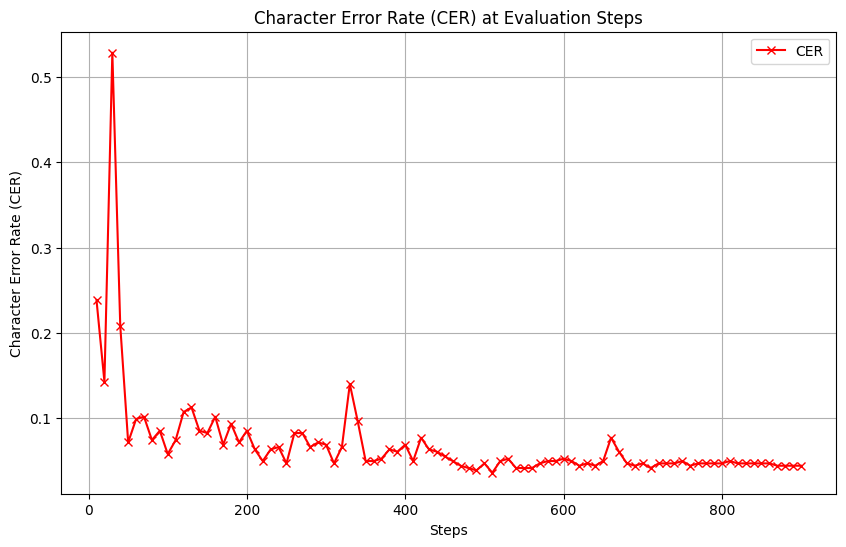

In [21]:
# Extract losses and steps for plotting
eval_steps = []
eval_cers = []

for log in trainer.state.log_history:
    if 'eval_loss' in log:
        eval_steps.append(log['step'])
        eval_cers.append(log['eval_cer'])

# Plot the losses
plt.figure(figsize=(10, 6))
plt.plot(eval_steps, eval_cers, marker='x', linestyle='-', color='r', label='CER')
plt.xlabel('Steps')
plt.ylabel('Character Error Rate (CER)')
plt.title('Character Error Rate (CER) at Evaluation Steps')
plt.legend()
plt.grid(True)
plt.show()

In [24]:
%pip install plotly

   ---------------------------------------- 0.0/16.4 MB ? eta -:--:--
   ---------------------------------------- 0.1/16.4 MB 1.7 MB/s eta 0:00:10
   - -------------------------------------- 0.6/16.4 MB 6.8 MB/s eta 0:00:03
   --- ------------------------------------ 1.4/16.4 MB 10.1 MB/s eta 0:00:02
   ------ --------------------------------- 2.7/16.4 MB 14.2 MB/s eta 0:00:01
   ---------- ----------------------------- 4.5/16.4 MB 19.2 MB/s eta 0:00:01
   ------------ --------------------------- 5.2/16.4 MB 20.9 MB/s eta 0:00:01
   ------------ --------------------------- 5.2/16.4 MB 20.9 MB/s eta 0:00:01
   ------------ --------------------------- 5.2/16.4 MB 20.9 MB/s eta 0:00:01
   ------------ --------------------------- 5.2/16.4 MB 20.9 MB/s eta 0:00:01
   ------------ --------------------------- 5.2/16.4 MB 20.9 MB/s eta 0:00:01
   ---------------- ----------------------- 6.8/16.4 MB 13.1 MB/s eta 0:00:01
   ---------------------- ----------------- 9.4/16.4 MB 17.2 MB/s eta 0:00

In [31]:
import plotly.graph_objects as go
import plotly.io as pio

# Use this if you are in a Jupyter Notebook
pio.renderers.default = 'iframe' # !!!

In [51]:
# Extract losses and steps for plotting
train_steps = []
train_losses = []
eval_steps = []
eval_losses = []

for log in trainer.state.log_history:
    if 'loss' in log:
        train_steps.append(log['step'])
        train_losses.append(log['loss'])
    if 'eval_loss' in log:
        eval_steps.append(log['step'])
        eval_losses.append(log['eval_loss'])

# Create the interactive plot with Plotly
fig = go.Figure()

# Add traces for training loss and evaluation loss
fig.add_trace(go.Scatter(x=train_steps, y=train_losses, name='Training Loss', line=dict(color='rgb(255, 95, 0)')))
fig.add_trace(go.Scatter(x=eval_steps, y=eval_losses, name='Evaluation Loss', line=dict(color='rgb(44, 160, 44)')))

# Update the layout to set the y-axis limit
fig.update_layout(
    title='Training and Evaluation Loss Over Time',
    xaxis_title='Step',
    yaxis_title='Loss',
    yaxis=dict(range=[0, 2.5]),  # Set y-axis limit
    legend=dict(x=0, y=1),
    hovermode="x unified",
    template="plotly_white"
)

# Show the plot
fig.show()

In [50]:
eval_steps = []
eval_cers = []

for log in trainer.state.log_history:
    if 'eval_loss' in log:
        eval_steps.append(log['step'])
        eval_cers.append(log['eval_cer'])

# Create the interactive plot with Plotly
fig = go.Figure()

# Add traces for training loss and evaluation loss
fig.add_trace(go.Scatter(x=eval_steps, y=eval_cers, name='Training Loss', line=dict(color='rgb(255, 32, 78)')))

# Update the layout to set the y-axis limit
fig.update_layout(
    title='Character Error Rate (CER) at Evaluation Steps',
    xaxis_title='Steps',
    yaxis_title='Character Error Rate (CER)',
    yaxis=dict(range=[0, 1]),  # Set y-axis limit
    legend=dict(x=0, y=1),
    hovermode="x unified",
    template="plotly_white"
)

# Show the plot
fig.show()

In [62]:
def trocr_inference(image, processor, model):
    # We can directly perform OCR on cropped images.
    pixel_values = processor(image, return_tensors='pt').pixel_values.to(device)
    generated_ids = model.generate(pixel_values)
    generated_text = processor.batch_decode(generated_ids, skip_special_tokens=True)[0]
    return generated_text

    
def get_label_info(image_path, keep_ambiguous=True): # For a single image
    """
    function to get label from image_path according to my specific naming method
    this is not the same as my colab notebook, cause name now contains "_fake"
    """
    name = os.path.basename(image_path)
    name = os.path.splitext(name)[0]
    name = name.replace("_fake", "") # !!!!!!! Add this line

    label, extreme_level, extra_info = '', '', ''

    # get label information
    if len(name.split("_")) == 2:
        label = name.split("_")[0]
        extreme_level = name.split("_")[1]
    elif len(name.split("_")) == 3:
        label = name.split("_")[0]
        extreme_level = name.split("_")[2]
    elif len(name.split("_")) == 4:
        label = name.split("_")[0]
        extreme_level = name.split("_")[2]
        extra_info = name.split("_")[3] # blur
    else:
        print("! Not in our format !")

    # for the image that I'm not sure the exact text label (specified by having parenthesis)
    if keep_ambiguous == True:
        # try yo fix text label based on the closest number that I can observe
        if len(label) != 0:
            # to check it has some unclear character
            if "(" in label:
                start_index = label.index("(")
                end_index = label.index(")")
                if label[start_index+1] == '3': # I want to change (3)8Z003 to 3Z003 (image are cropped badly)
                    label = "3" + label[4:]
                else: # 8Z03(7), just this image, I want to remove "7"
                    label = label[:start_index] + label[end_index+1:]
        else:
            print("Error: Can't get text label information")
    else:
        # to remove the unclear image
        if len(label) != 0:
            if "(" in label:
                return "remove"

    return label, extreme_level, extra_info


def character_accuracy(pred_texts, true_texts):
    total_correct_chars = 0
    total_chars = 0
    for pred_text, true_text in zip(pred_texts, true_texts):
        for pred_char, true_char in zip(pred_text, true_text):
            if pred_char == true_char:
                total_correct_chars += 1
            total_chars += 1
    return total_correct_chars / total_chars if total_chars != 0 else 0

In [63]:
def get_experiment_accuracy(image_paths, processor, model):
    #image_paths = sorted(glob("/content/2401UTAC_jpg_cropped/*"))
    
    result_dict = {"image_path":[], "true_text":[], "predicted_text":[]}
    result_normal_dict = {"image_path":[], "true_text":[], "predicted_text":[]}
    result_hard_dict = {"image_path":[], "true_text":[], "predicted_text":[]}
    result_extreme_dict = {"image_path":[], "true_text":[], "predicted_text":[]}
    result_unreadable_dict = {"image_path":[], "true_text":[], "predicted_text":[]}
    
    for image_path in tqdm(image_paths):
        image = Image.open(image_path).convert("RGB")
        gt_text, extreme_level, _ = get_label_info(image_path, keep_ambiguous=True)
        pred_text = trocr_inference(image, processor, model)
        
        # all
        result_dict["image_path"].append(image_path)
        result_dict["true_text"].append(gt_text)
        result_dict["predicted_text"].append(pred_text)
        # normal
        if extreme_level == 'normal':
            result_normal_dict["image_path"].append(image_path)
            result_normal_dict["true_text"].append(gt_text)
            result_normal_dict["predicted_text"].append(pred_text)
        elif extreme_level == 'hard':
            result_hard_dict["image_path"].append(image_path)
            result_hard_dict["true_text"].append(gt_text)
            result_hard_dict["predicted_text"].append(pred_text)
        elif extreme_level == 'extreme':
            result_extreme_dict["image_path"].append(image_path)
            result_extreme_dict["true_text"].append(gt_text)
            result_extreme_dict["predicted_text"].append(pred_text)
        elif extreme_level == 'unreadable':
            result_unreadable_dict["image_path"].append(image_path)
            result_unreadable_dict["true_text"].append(gt_text)
            result_unreadable_dict["predicted_text"].append(pred_text)
            
    acc_all = character_accuracy(pred_texts=result_dict['predicted_text'], true_texts=result_dict['true_text'])
    acc_normal = character_accuracy(pred_texts=result_normal_dict['predicted_text'], true_texts=result_normal_dict['true_text'])
    acc_hard = character_accuracy(pred_texts=result_hard_dict['predicted_text'], true_texts=result_hard_dict['true_text'])
    acc_extreme = character_accuracy(pred_texts=result_extreme_dict['predicted_text'], true_texts=result_extreme_dict['true_text'])
    acc_unreadable = character_accuracy(pred_texts=result_unreadable_dict['predicted_text'], true_texts=result_unreadable_dict['true_text'])
    print(f"Experiment Detail >>> Finetuning TrOCR")
    print(f"Character Accuracy [All]: {acc_all}")
    print(f"Character Accuracy [Normal]: {acc_normal}")
    print(f"Character Accuracy [Hard]: {acc_hard}")
    print(f"Character Accuracy [Extreme]: {acc_extreme}")
    print(f"Character Accuracy [Unreadable]: {acc_unreadable}")

    return result_normal_dict, result_hard_dict, result_extreme_dict, result_unreadable_dict

In [64]:
# load model

# processor = TrOCRProcessor.from_pretrained("microsoft/trocr-large-printed")
image_paths = sorted(glob("./test_images/2401UTAC_jpg_cropped/*"))
trained_model = VisionEncoderDecoderModel.from_pretrained('./results/checkpoint-900').to(device)
result_normal_dict, result_hard_dict, result_extreme_dict, result_unreadable_dict = get_experiment_accuracy(image_paths, processor, trained_model)

100%|████████████████████████████████████████████████████████████████████████████████| 160/160 [01:33<00:00,  1.71it/s]

Experiment Detail >>> Finetuning TrOCR
Character Accuracy [All]: 0.8870765370138017
Character Accuracy [Normal]: 0.9422222222222222
Character Accuracy [Hard]: 0.9279279279279279
Character Accuracy [Extreme]: 0.7939698492462312
Character Accuracy [Unreadable]: 0.6571428571428571


In [67]:
import plotly.graph_objects as go

# Extracted data from the image
categories = ["All", "Normal", "Hard", "Extreme", "Unreadable"]
accuracies = [0.8870765370138017, 0.9422222222222222, 0.9279279279279279, 0.7939698492462312, 0.6571428571428571]

# Create a bar chart
fig = go.Figure()

# Add bar trace
fig.add_trace(go.Bar(
    x=categories,
    y=accuracies,
    marker=dict(color=['rgb(247,37,133)', 'rgb(2,62,138)', 'rgb (0,119,182)', 'rgb(0, 180, 216)', 'rgb(72, 202, 228)'])
))

# Update layout
fig.update_layout(
    title='Character Accuracy for Different Categories',
    xaxis_title='Category',
    yaxis_title='Accuracy',
    yaxis=dict(range=[0, 1]),  # Set y-axis limit from 0 to 1
    template='plotly_white'
)

# Show the plot
fig.show()
